In [1]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import MACCSkeys
from rdkit.Chem.Crippen import MolLogP, MolMR
from rdkit.Chem.Descriptors import ExactMolWt
from rdkit.Chem.Scaffolds.MurckoScaffold import GetScaffoldForMol
from rdkit.Chem import Draw
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import parmap
import warnings
warnings.filterwarnings("ignore")
from rdkit import RDLogger
RDLogger.DisableLog('rdApp.*')

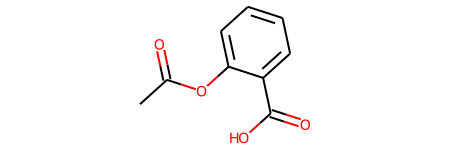

In [2]:
# Aspirin
Chem.MolFromSmiles('CC(=O)OC1=CC=CC=C1C(=O)O')

In [3]:
df1 = pd.read_csv('./PubChem_Similar_Aspirin.csv')
df1

,cid,cmpdname,cmpdsynonym,mw,mf,polararea,complexity,xlogp,heavycnt,hbonddonor,...,inchikey,iupacname,meshheadings,annothits,annothitcnt,aids,cidcdate,sidsrcname,depcatg,annotation
0,2244,Aspirin,aspirin|ACETYLSALICYLIC ACID|50-78-2|2-Acetoxy...,180.16,C9H8O4,63.6,212.0,1.2,13,1,...,BSYNRYMUTXBXSQ-UHFFFAOYSA-N,2-acetyloxybenzoic acid,Aspirin,Biological Test Results|Biomolecular Interacti...,13,1|3|9|15|19|21|23|25|29|31|33|35|37|39|41|43|4...,20040916,001Chemical|3B Scientific (Wuhan) Corp|3WAY PH...,Chemical Vendors|Curation Efforts|Governmental...,"COVID-19, COVID19, Coronavirus, Corona-virus, ..."
1,4133,Methyl salicylate,methyl salicylate|Methyl 2-hydroxybenzoate|119...,152.15,C8H8O3,46.5,144.0,2.3,11,1,...,OSWPMRLSEDHDFF-UHFFFAOYSA-N,methyl 2-hydroxybenzoate,NaN,Biological Test Results|Biomolecular Interacti...,14,155|157|161|165|167|175|421|426|427|433|434|43...,20050325,001Chemical|3B Scientific (Wuhan) Corp|3WAY PH...,Chemical Vendors|Curation Efforts|Governmental...,NaN
2,5161,Salsalate,Salsalate|552-94-3|sasapyrine|Salicylsalicylic...,258.23,C14H10O5,83.8,341.0,3.0,19,2,...,WVYADZUPLLSGPU-UHFFFAOYSA-N,2-(2-hydroxybenzoyl)oxybenzoic acid,NaN,Biological Test Results|Biomolecular Interacti...,12,179|248|875|880|881|884|885|887|889|892|893|89...,20050325,001Chemical|3B Scientific (Wuhan) Corp|3WAY PH...,Chemical Vendors|Curation Efforts|Governmental...,NaN
3,6247,Aspirin calcium,Aspirin calcium|Calcium aspirin|Ascal|69-46-5|...,398.40,C18H14CaO8,133.0,206.0,NaN,27,0,...,KRALOLGXHLZTCW-UHFFFAOYSA-L,calcium;2-acetyloxybenzoate,Aspirin,Classification|Drug and Medication Information...,7,NaN,20050808,AAA Chemistry|ABI Chem|Ambinter|AN PharmaTech|...,Chemical Vendors|Curation Efforts|Governmental...,NaN
4,6876,2-Hydroxyethyl 2-acetyloxybenzoate,SCHEMBL8383250,224.21,C11H12O5,72.8,251.0,0.5,16,1,...,NKAIIFWPOWVGOC-UHFFFAOYSA-N,2-hydroxyethyl 2-acetyloxybenzoate,NaN,Patents,1,NaN,20050808,AAA Chemistry|ABI Chem|Chemieliva Pharmaceutic...,Chemical Vendors|Curation Efforts|Governmental...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,57131608,"2,2'-(1,10-Dioxodecane-1,10-diylbisoxy)dibenzo...","SCHEMBL973615|2,2'-(1,10-Dioxodecane-1,10-diyl...",442.50,C24H26O8,127.0,578.0,4.9,32,2,...,XVGPREYMODJRKV-UHFFFAOYSA-N,2-[10-(2-carboxyphenoxy)-10-oxodecanoyl]oxyben...,NaN,Patents,1,NaN,20120613,Google Patents|IBM|Japan Chemical Substance Di...,Curation Efforts|Governmental Organizations|Le...,NaN
1996,57144682,[2-(2-Hydroxybenzoyl)oxycarbonylphenyl] 2-hydr...,NaN,378.30,C21H14O7,110.0,575.0,5.0,28,2,...,PACJSISIZIMYDU-UHFFFAOYSA-N,[2-(2-hydroxybenzoyl)oxycarbonylphenyl] 2-hydr...,NaN,Patents,1,NaN,20120613,IBM,Research and Development,NaN
1997,57148452,4-(2-Formylphenoxy)hexanoic acid,SCHEMBL10745040,236.26,C13H16O4,63.6,252.0,2.2,17,1,...,PFKWEDYXOSQVTG-UHFFFAOYSA-N,4-(2-formylphenoxy)hexanoic acid,NaN,Patents,1,NaN,20120613,IBM|SureChEMBL,Curation Efforts|Research and Development,NaN
1998,57150309,2-(14-Prop-2-enoyloxytetradecoxy)benzoic acid,NaN,404.50,C24H36O5,72.8,449.0,7.7,29,1,...,GIYKOSWGVAQNPZ-UHFFFAOYSA-N,2-(14-prop-2-enoyloxytetradecoxy)benzoic acid,NaN,Patents,1,NaN,20120614,IBM,Research and Development,NaN


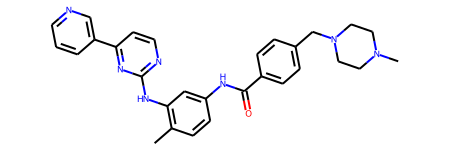

In [4]:
# Imatinib
Chem.MolFromSmiles('CC1=C(C=C(C=C1)NC(=O)C2=CC=C(C=C2)CN3CCN(CC3)C)NC4=NC=CC(=N4)C5=CN=CC=C5')

In [5]:
df2 = pd.read_csv('./PubChem_Similar_Imatinib.csv')
df2

,cid,cmpdname,cmpdsynonym,mw,mf,polararea,complexity,xlogp,heavycnt,hbonddonor,...,inchikey,iupacname,meshheadings,annothits,annothitcnt,aids,cidcdate,sidsrcname,depcatg,annotation
0,4327,n-[4-Methyl-3-[[4-(3-pyridinyl)-2-pyrimidinyl]...,UNII-Q8SP783P3P|n-[4-methyl-3-[[4-(3-pyridinyl...,382.4,C22H18N6O,92.7,531.0,2.8,29,2,...,YWQVBESSYLICRX-UHFFFAOYSA-N,N-[4-methyl-3-[(4-pyridin-3-ylpyrimidin-2-yl)a...,NaN,Biomolecular Interactions and Pathways|Classif...,6,NaN,20050325,ABI Chem|Chembase.cn|ChemDB|ChemIDplus|ChemSpi...,Chemical Vendors|Curation Efforts|Governmental...,NaN
1,5291,Imatinib,Imatinib|152459-95-5|STI571|Glivec|Imatinib (S...,493.6,C29H31N7O,86.3,706.0,3.5,37,2,...,KTUFNOKKBVMGRW-UHFFFAOYSA-N,4-[(4-methylpiperazin-1-yl)methyl]-N-[4-methyl...,Imatinib Mesylate,Biological Test Results|Biomolecular Interacti...,12,1|3|5|7|9|13|15|19|21|23|25|29|31|33|35|37|39|...,20050325,001Chemical|3A SpeedChemical Inc|3B Scientific...,Chemical Vendors|Curation Efforts|Governmental...,"COVID-19, COVID19, Coronavirus, Corona-virus, ..."
2,72993,"1-N,4-N-bis[4-[(2-amino-1-ethylpyrimidin-1-ium...",CHEMBL3306681|ZINC1714230,590.7,C32H34N10O2+2,168.0,830.0,4.1,44,6,...,LZKBETNHSZKWEL-UHFFFAOYSA-P,"1-N,4-N-bis[4-[(2-amino-1-ethylpyrimidin-1-ium...",NaN,NaN,0,NaN,20050326,AAA Chemistry|ABI Chem|ChEMBL|ChemDB|ChemIDplu...,Chemical Vendors|Curation Efforts|Governmental...,NaN
3,123596,Imatinib mesylate,Imatinib mesylate|220127-57-1|Gleevec|Glivec|I...,589.7,C30H35N7O4S,149.0,799.0,NaN,42,3,...,YLMAHDNUQAMNNX-UHFFFAOYSA-N,methanesulfonic acid;4-[(4-methylpiperazin-1-y...,Imatinib Mesylate,Biological Test Results|Biomolecular Interacti...,12,1376|1385|1422|1465|1511|1529|1530|1531|1532|1...,20050326,001Chemical|3A SpeedChemical Inc|3B Scientific...,Chemical Vendors|Curation Efforts|Governmental...,"COVID-19, COVID19, Coronavirus, Corona-virus, ..."
4,420572,"1-N,4-N-bis[4-(2,4-diamino-1-methylpyrimidin-1...",CHEMBL3306726|ZINC1714226|ZINC01714226,562.6,C30H30N10O2+2,196.0,829.0,2.3,42,6,...,IMIASJKOOFTURB-UHFFFAOYSA-P,"1-N,4-N-bis[4-(2,4-diamino-1-methylpyrimidin-1...",NaN,NaN,0,NaN,20050326,Abbott Labs|ABI Chem|ChEMBL|ChemDB|ChemSpider|...,Chemical Vendors|Curation Efforts|Governmental...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,60444623,N-[4-[2-oxo-2-(4-pyrimidin-2-ylpiperazin-1-yl)...,AKOS008637508,477.6,C29H27N5O2,78.4,697.0,4.0,36,1,...,AXKLPUQTSOJTKJ-UHFFFAOYSA-N,N-[4-[2-oxo-2-(4-pyrimidin-2-ylpiperazin-1-yl)...,NaN,NaN,0,NaN,20121018,AKos Consulting & Solutions|Aurora Fine Chemic...,Chemical Vendors|Legacy Depositors,NaN
1996,60444649,"3,4-dimethyl-N-[4-[2-oxo-2-(4-pyrimidin-2-ylpi...",AKOS008637538,429.5,C25H27N5O2,78.4,622.0,3.1,32,1,...,WZENFJPEMIUYJQ-UHFFFAOYSA-N,"3,4-dimethyl-N-[4-[2-oxo-2-(4-pyrimidin-2-ylpi...",NaN,NaN,0,NaN,20121018,AKos Consulting & Solutions|Aurora Fine Chemic...,Chemical Vendors|Legacy Depositors,NaN
1997,60444692,2-ethyl-3-methyl-N-[4-[2-oxo-2-(4-pyrimidin-2-...,AKOS008637589,494.6,C29H30N6O2,91.3,758.0,3.8,37,1,...,LATVNDJEZHOBLW-UHFFFAOYSA-N,2-ethyl-3-methyl-N-[4-[2-oxo-2-(4-pyrimidin-2-...,NaN,NaN,0,NaN,20121018,AKos Consulting & Solutions|Aurora Fine Chemic...,Chemical Vendors|Legacy Depositors,NaN
1998,60544918,2-anilino-N-[4-[2-oxo-2-(4-pyrimidin-2-ylpiper...,AKOS008798336,492.6,C29H28N6O2,90.5,722.0,4.5,37,2,...,OFMDMIMNNXTJTR-UHFFFAOYSA-N,2-anilino-N-[4-[2-oxo-2-(4-pyrimidin-2-ylpiper...,NaN,NaN,0,NaN,20121018,AKos Consulting & Solutions,Chemical Vendors,NaN


In [6]:
df1['Group'] = 'Group 1'
df2['Group'] = 'Group 2'
df = pd.concat([df1, df2]).reset_index(drop=True)
df

,cid,cmpdname,cmpdsynonym,mw,mf,polararea,complexity,xlogp,heavycnt,hbonddonor,...,iupacname,meshheadings,annothits,annothitcnt,aids,cidcdate,sidsrcname,depcatg,annotation,Group
0,2244,Aspirin,aspirin|ACETYLSALICYLIC ACID|50-78-2|2-Acetoxy...,180.16,C9H8O4,63.6,212.0,1.2,13,1,...,2-acetyloxybenzoic acid,Aspirin,Biological Test Results|Biomolecular Interacti...,13,1|3|9|15|19|21|23|25|29|31|33|35|37|39|41|43|4...,20040916,001Chemical|3B Scientific (Wuhan) Corp|3WAY PH...,Chemical Vendors|Curation Efforts|Governmental...,"COVID-19, COVID19, Coronavirus, Corona-virus, ...",Group 1
1,4133,Methyl salicylate,methyl salicylate|Methyl 2-hydroxybenzoate|119...,152.15,C8H8O3,46.5,144.0,2.3,11,1,...,methyl 2-hydroxybenzoate,NaN,Biological Test Results|Biomolecular Interacti...,14,155|157|161|165|167|175|421|426|427|433|434|43...,20050325,001Chemical|3B Scientific (Wuhan) Corp|3WAY PH...,Chemical Vendors|Curation Efforts|Governmental...,NaN,Group 1
2,5161,Salsalate,Salsalate|552-94-3|sasapyrine|Salicylsalicylic...,258.23,C14H10O5,83.8,341.0,3.0,19,2,...,2-(2-hydroxybenzoyl)oxybenzoic acid,NaN,Biological Test Results|Biomolecular Interacti...,12,179|248|875|880|881|884|885|887|889|892|893|89...,20050325,001Chemical|3B Scientific (Wuhan) Corp|3WAY PH...,Chemical Vendors|Curation Efforts|Governmental...,NaN,Group 1
3,6247,Aspirin calcium,Aspirin calcium|Calcium aspirin|Ascal|69-46-5|...,398.40,C18H14CaO8,133.0,206.0,NaN,27,0,...,calcium;2-acetyloxybenzoate,Aspirin,Classification|Drug and Medication Information...,7,NaN,20050808,AAA Chemistry|ABI Chem|Ambinter|AN PharmaTech|...,Chemical Vendors|Curation Efforts|Governmental...,NaN,Group 1
4,6876,2-Hydroxyethyl 2-acetyloxybenzoate,SCHEMBL8383250,224.21,C11H12O5,72.8,251.0,0.5,16,1,...,2-hydroxyethyl 2-acetyloxybenzoate,NaN,Patents,1,NaN,20050808,AAA Chemistry|ABI Chem|Chemieliva Pharmaceutic...,Chemical Vendors|Curation Efforts|Governmental...,NaN,Group 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,60444623,N-[4-[2-oxo-2-(4-pyrimidin-2-ylpiperazin-1-yl)...,AKOS008637508,477.60,C29H27N5O2,78.4,697.0,4.0,36,1,...,N-[4-[2-oxo-2-(4-pyrimidin-2-ylpiperazin-1-yl)...,NaN,NaN,0,NaN,20121018,AKos Consulting & Solutions|Aurora Fine Chemic...,Chemical Vendors|Legacy Depositors,NaN,Group 2
3996,60444649,"3,4-dimethyl-N-[4-[2-oxo-2-(4-pyrimidin-2-ylpi...",AKOS008637538,429.50,C25H27N5O2,78.4,622.0,3.1,32,1,...,"3,4-dimethyl-N-[4-[2-oxo-2-(4-pyrimidin-2-ylpi...",NaN,NaN,0,NaN,20121018,AKos Consulting & Solutions|Aurora Fine Chemic...,Chemical Vendors|Legacy Depositors,NaN,Group 2
3997,60444692,2-ethyl-3-methyl-N-[4-[2-oxo-2-(4-pyrimidin-2-...,AKOS008637589,494.60,C29H30N6O2,91.3,758.0,3.8,37,1,...,2-ethyl-3-methyl-N-[4-[2-oxo-2-(4-pyrimidin-2-...,NaN,NaN,0,NaN,20121018,AKos Consulting & Solutions|Aurora Fine Chemic...,Chemical Vendors|Legacy Depositors,NaN,Group 2
3998,60544918,2-anilino-N-[4-[2-oxo-2-(4-pyrimidin-2-ylpiper...,AKOS008798336,492.60,C29H28N6O2,90.5,722.0,4.5,37,2,...,2-anilino-N-[4-[2-oxo-2-(4-pyrimidin-2-ylpiper...,NaN,NaN,0,NaN,20121018,AKos Consulting & Solutions,Chemical Vendors,NaN,Group 2


In [7]:
def csmiles(smi):
    try:
        csmi = Chem.MolToSmiles(Chem.MolFromSmiles(smi))
        if str(csmi) != 'nan':
            return csmi
        else:
            return 'NaN'
    except:
        return 'NaN'

In [8]:
csmis = parmap.map(csmiles, df['isosmiles'].tolist(), 
                   pm_pbar=True, pm_processes=10)

  0%|          | 0/4000 [00:00<?, ?it/s]

In [9]:
df['SMILES']  = csmis
df = df[df['SMILES'] != 'NaN'].reset_index(drop=True)
df = df[['SMILES', 'Group']]
df

,SMILES,Group
0,CC(=O)Oc1ccccc1C(=O)O,Group 1
1,COC(=O)c1ccccc1O,Group 1
2,O=C(Oc1ccccc1C(=O)O)c1ccccc1O,Group 1
3,CC(=O)Oc1ccccc1C(=O)[O-].CC(=O)Oc1ccccc1C(=O)[...,Group 1
4,CC(=O)Oc1ccccc1C(=O)OCCO,Group 1
...,...,...
3995,O=C(Nc1ccc(CC(=O)N2CCN(c3ncccn3)CC2)cc1)c1ccc(...,Group 2
3996,Cc1ccc(C(=O)Nc2ccc(CC(=O)N3CCN(c4ncccn4)CC3)cc...,Group 2
3997,CCc1nc2ccccc2c(C(=O)Nc2ccc(CC(=O)N3CCN(c4ncccn...,Group 2
3998,O=C(Nc1ccc(CC(=O)N2CCN(c3ncccn3)CC2)cc1)c1cccc...,Group 2


In [10]:
def getproperties(smi):
    m = Chem.MolFromSmiles(smi)
    logp = MolLogP(m)
    molwt = ExactMolWt(m)
    natom = m.GetNumAtoms()
    molmr = MolMR(m)
    return logp, molwt, natom, molmr

In [11]:
properties = parmap.map(getproperties, df['SMILES'].tolist(), 
                   pm_pbar=True, pm_processes=10)

  0%|          | 0/4000 [00:00<?, ?it/s]

In [12]:
df['logP'] = [p[0] for p in properties]
df['MW'] = [p[1] for p in properties]
df['Atom'] = [p[2] for p in properties]
df['MR'] = [p[3] for p in properties]
g1 = df[df['Group'] == 'Group 1'].reset_index(drop=True)
g2 = df[df['Group'] == 'Group 2'].reset_index(drop=True)

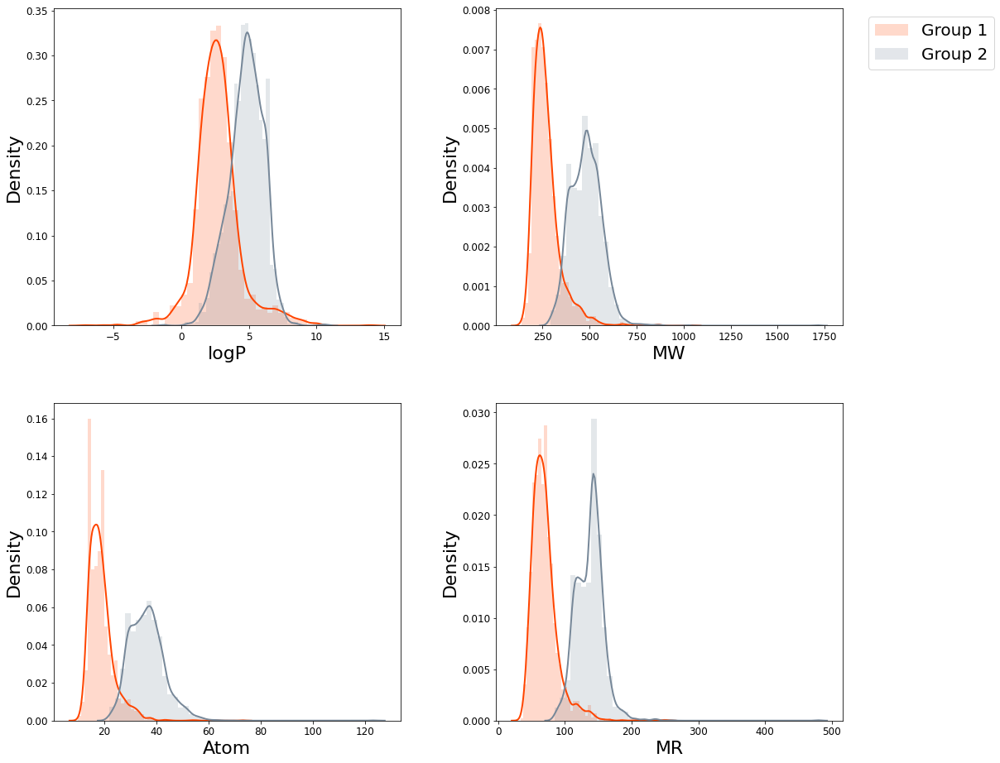

In [13]:
al = 0.2
lw = 2

plt.figure(figsize=(18, 14))
kwargs = dict(hist_kws={'alpha':al}, kde_kws={'linewidth':lw})
p = 1
for prop in ['logP', 'MW', 'Atom', 'MR']:
    plt.subplot(2, 2, p)
    sns.distplot(g1[prop], color="orangered", label="Group 1", **kwargs)
    sns.distplot(g2[prop], color="lightslategrey", label="Group 2", **kwargs)
    plt.xlabel(prop, fontsize=22)
    plt.ylabel('Density', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    if p == 2:
        plt.legend(bbox_to_anchor=(1.05, 1.0), 
                   loc='upper left', 
                   fontsize=20)
    else:
        plt.legend([],[], frameon=False)
    p += 1
    
plt.tight_layout(pad=5)
plt.show()

In [14]:
def make_fp(inputs):
    smi, method = inputs
    mol = Chem.MolFromSmiles(smi)
    if method == 'Morgan':
        fp = np.array(AllChem.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=1024)).tolist()
    elif method == 'MACCS':
        fp = np.array(MACCSkeys.GenMACCSKeys(mol)).tolist()
    elif method == 'RDKit':
        fp = np.array(AllChem.RDKFingerprint(mol)).tolist()
    return fp

In [15]:
ms = 50
al = 0.8

In [16]:
pcadfs = []
tsnedfs = []
for method in ['Morgan', 'MACCS', 'RDKit']:
    fps = parmap.map(make_fp, [[smi, method] for smi in df['SMILES'].tolist()], 
                      pm_pbar=True, pm_processes=10)
    
    pca = PCA(n_components=2)
    pcafps = pca.fit_transform(fps)
    
    tsne = TSNE(n_components=2, n_jobs=-1)
    tsnefps = tsne.fit_transform(fps)
    
    pcadf = pd.DataFrame({'X':pcafps[:,0], 'Y':pcafps[:,1], 
                          'logP':df['logP'].tolist(), 
                          'MW':df['MW'].tolist(), 
                          'Atom':df['Atom'].tolist(), 
                          'MR':df['MR'].tolist(), 
                          'Group':df['Group'].tolist()})
    tsnedf = pd.DataFrame({'X':tsnefps[:,0], 'Y':tsnefps[:,1], 
                           'logP':df['logP'].tolist(), 
                           'MW':df['MW'].tolist(), 
                           'Atom':df['Atom'].tolist(), 
                           'MR':df['MR'].tolist(), 
                           'Group':df['Group'].tolist()})
    
    pcadfs.append(pcadf)
    tsnedfs.append(tsnedf)        

  0%|          | 0/4000 [00:00<?, ?it/s]

  0%|          | 0/4000 [00:00<?, ?it/s]

  0%|          | 0/4000 [00:00<?, ?it/s]

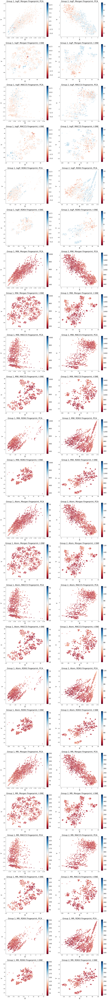

In [17]:
plt.figure(figsize=(18, 18*9))
p = 1
for prop in ['logP', 'MW', 'Atom', 'MR']:
    for method, pcadf, tsnedf in zip(['Morgan', 'MACCS', 'RDKit'], pcadfs, tsnedfs):
        pcadf1 = pcadf[pcadf['Group'] == 'Group 1'].reset_index(drop=True)
        pcadf2 = pcadf[pcadf['Group'] == 'Group 2'].reset_index(drop=True)
        tsnedf1 = tsnedf[tsnedf['Group'] == 'Group 1'].reset_index(drop=True)
        tsnedf2 = tsnedf[tsnedf['Group'] == 'Group 2'].reset_index(drop=True)
        
        plt.subplot(24, 2, p)
        plt.title(f'Group 1, {prop}, {method} Fingerprint, PCA', fontsize=22)
        ax = sns.scatterplot(x="X", y="Y", hue=prop, data=pcadf1, 
                             palette='RdBu', s=ms, alpha=al)
        norm = plt.Normalize(pcadf1[prop].min(), pcadf1[prop].max())
        sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
        sm.set_array([])
        ax.get_legend().remove()
        cbar = ax.figure.colorbar(sm)
        ax.set_xlabel('X', fontsize=22)
        ax.set_ylabel('Y', fontsize=22)
        ax.tick_params(axis="x", labelsize=12)
        ax.tick_params(axis="y", labelsize=12)
        for t in cbar.ax.get_yticklabels():
            t.set_fontsize(18)
        p += 1
        
        plt.subplot(24, 2, p)
        plt.title(f'Group 2, {prop}, {method} Fingerprint, PCA', fontsize=22)
        ax = sns.scatterplot(x="X", y="Y", hue=prop, data=pcadf2, 
                             palette='RdBu', s=ms, alpha=al)
        norm = plt.Normalize(pcadf2[prop].min(), pcadf2[prop].max())
        sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
        sm.set_array([])
        ax.get_legend().remove()
        cbar = ax.figure.colorbar(sm)
        ax.set_xlabel('X', fontsize=22)
        ax.set_ylabel('Y', fontsize=22)
        ax.tick_params(axis="x", labelsize=12)
        ax.tick_params(axis="y", labelsize=12)
        for t in cbar.ax.get_yticklabels():
            t.set_fontsize(18)
        p += 1

        plt.subplot(24, 2, p)
        plt.title(f'Group 1, {prop}, {method} Fingerprint, t-SNE', fontsize=22)
        ax = sns.scatterplot(x="X", y="Y", hue=prop, data=tsnedf1, 
                             palette='RdBu', s=ms, alpha=al)
        norm = plt.Normalize(tsnedf1[prop].min(), tsnedf1[prop].max())
        sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
        sm.set_array([])
        ax.get_legend().remove()
        cbar = ax.figure.colorbar(sm)
        ax.set_xlabel('X', fontsize=22)
        ax.set_ylabel('Y', fontsize=22)
        ax.tick_params(axis="x", labelsize=12)
        ax.tick_params(axis="y", labelsize=12)
        for t in cbar.ax.get_yticklabels():
            t.set_fontsize(18)
        p += 1
        
        plt.subplot(24, 2, p)
        plt.title(f'Group 2, {prop}, {method} Fingerprint, t-SNE', fontsize=22)
        ax = sns.scatterplot(x="X", y="Y", hue=prop, data=tsnedf2, 
                             palette='RdBu', s=ms, alpha=al)
        norm = plt.Normalize(tsnedf2[prop].min(), tsnedf2[prop].max())
        sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
        sm.set_array([])
        ax.get_legend().remove()
        cbar = ax.figure.colorbar(sm)
        ax.set_xlabel('X', fontsize=22)
        ax.set_ylabel('Y', fontsize=22)
        ax.tick_params(axis="x", labelsize=12)
        ax.tick_params(axis="y", labelsize=12)
        for t in cbar.ax.get_yticklabels():
            t.set_fontsize(18)
        p += 1
        
plt.tight_layout(pad=2)
plt.show()

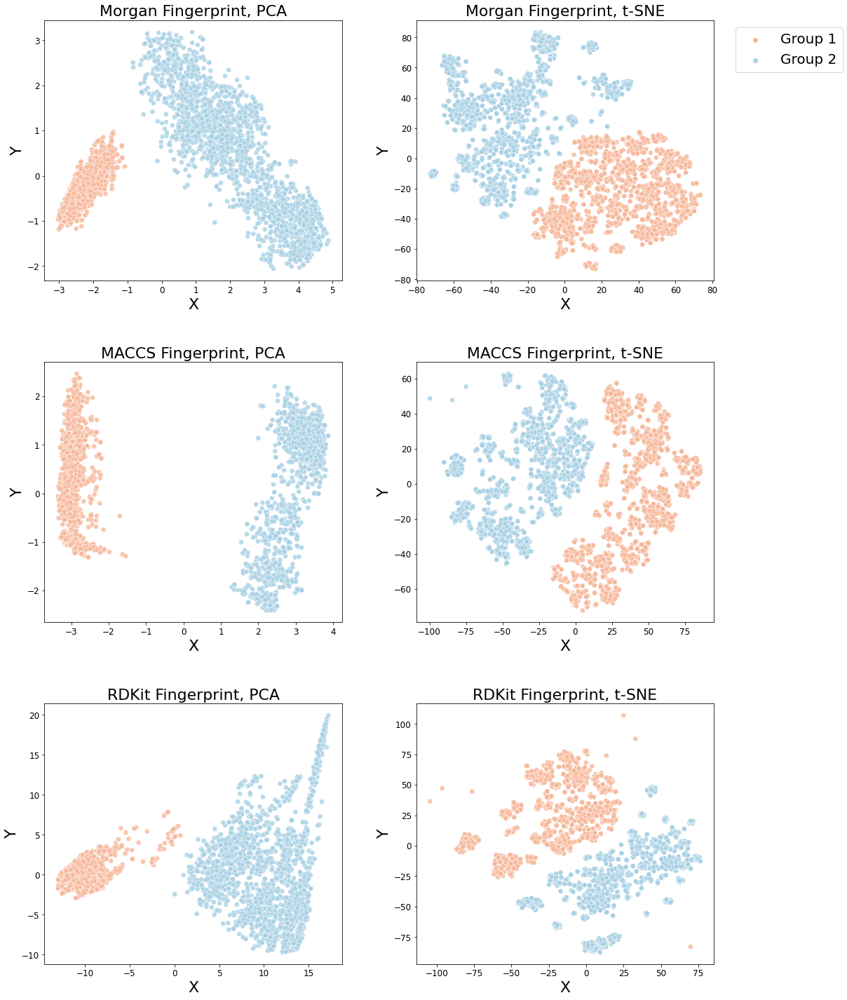

In [18]:
plt.figure(figsize=(18, 21))
p = 1
for method, pcadf, tsnedf in zip(['Morgan', 'MACCS', 'RDKit'], pcadfs, tsnedfs):

    plt.subplot(3, 2, p)
    plt.title(f'{method} Fingerprint, PCA', fontsize=22)
    sns.scatterplot(x='X', y='Y', hue='Group', palette='RdBu', data=pcadf, s=ms, alpha=al)
    plt.xlabel('X', fontsize=22)
    plt.ylabel('Y', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend([],[], frameon=False)
    p += 1
    
    plt.subplot(3, 2, p)
    plt.title(f'{method} Fingerprint, t-SNE', fontsize=22)
    sns.scatterplot(x='X', y='Y', hue='Group', palette='RdBu', data=tsnedf, s=ms, alpha=al)
    plt.xlabel('X', fontsize=22)
    plt.ylabel('Y', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    if p == 2:
        plt.legend(bbox_to_anchor=(1.05, 1.0), 
                   loc='upper left', 
                   fontsize=20)
    else:
        plt.legend([],[], frameon=False)
    p += 1
    
plt.tight_layout(pad=5)
plt.show()

In [19]:
scaffs1 = []
for s in g1['SMILES'].tolist():
    try:
        sc = GetScaffoldForMol(Chem.MolFromSmiles(s))
        scaffs1.append(Chem.MolToSmiles(sc))
    except:
        continue

In [20]:
scaffs2 = []
for s in g2['SMILES'].tolist():
    try:
        sc = GetScaffoldForMol(Chem.MolFromSmiles(s))
        scaffs2.append(Chem.MolToSmiles(sc))
    except:
        continue

In [21]:
scaffdf1 = pd.DataFrame({'SMILES':[sc for sc in scaffs1], 'Count':[scaffs1.count(sc) for sc in scaffs1]})
scaffdf2 = pd.DataFrame({'SMILES':[sc for sc in scaffs2], 'Count':[scaffs2.count(sc) for sc in scaffs2]})

scaffdf1 = scaffdf1.sort_values(['Count'], ascending=False).drop_duplicates(['SMILES']).reset_index(drop=True)
scaffdf2 = scaffdf2.sort_values(['Count'], ascending=False).drop_duplicates(['SMILES']).reset_index(drop=True)

In [22]:
for sc in scaffdf1['SMILES'].tolist():
    if sc in scaffdf2['SMILES'].tolist():
        print(sc)

In [23]:
for sc in scaffdf2['SMILES'].tolist():
    if sc in scaffdf1['SMILES'].tolist():
        print(sc)

In [24]:
scaffdf1 = scaffdf1[scaffdf1['Count'] > 10].reset_index(drop=True)
scaffdf2 = scaffdf2[scaffdf2['Count'] > 10].reset_index(drop=True)

In [25]:
scaffdf1

,SMILES,Count
0,c1ccccc1,1290
1,O=C(Oc1ccccc1)c1ccccc1,201
2,c1ccc(Oc2ccccc2)cc1,129
3,c1ccc(COc2ccccc2)cc1,37
4,c1ccccc1.c1ccccc1,24
5,O=C(OOC(=O)c1ccccc1)c1ccccc1,18
6,O=c1ccc2ccccc2o1,17
7,O=C(/C=C/c1ccccc1)Oc1ccccc1,16
8,O=c1ccoc2ccccc12,15
9,c1ccc(OCCOc2ccccc2)cc1,12


In [26]:
scaffdf2

,SMILES,Count
0,O=C(Nc1cccc(Nc2nccc(-c3cccnc3)n2)c1)c1ccc(CN2C...,158
1,O=C(Nc1cccc(-n2ccnc2)c1)c1cccc(Nc2nccc(-c3cccn...,134
2,O=C(Nc1cccc(Nc2nccc(-c3cccnc3)n2)c1)c1ccccc1,88
3,O=C(Nc1ccccc1)c1cccc(Nc2ncccc2-c2ccncn2)c1,37
4,O=C(Nc1cccc(Nc2nccc(-c3cncnc3)n2)c1)c1ccc(CN2C...,33
5,O=C(Nc1cccc(-n2cccc2)c1)c1cccc(Nc2nccc(-c3cccn...,31
6,O=C(c1ccccc1)N1CCCC(c2ccnc(Nc3ccccc3)n2)C1,26
7,O=C(Nc1ccccc1)c1cnc(-c2ccccc2)nc1-c1ccncc1,25
8,O=C(Nc1ccccc1)c1cccc(Cc2ncccc2-c2ccncn2)c1,20
9,O=C(Nc1cccc(N2Cc3cnc(Nc4cccnc4)nc3NC2=O)c1)c1c...,20


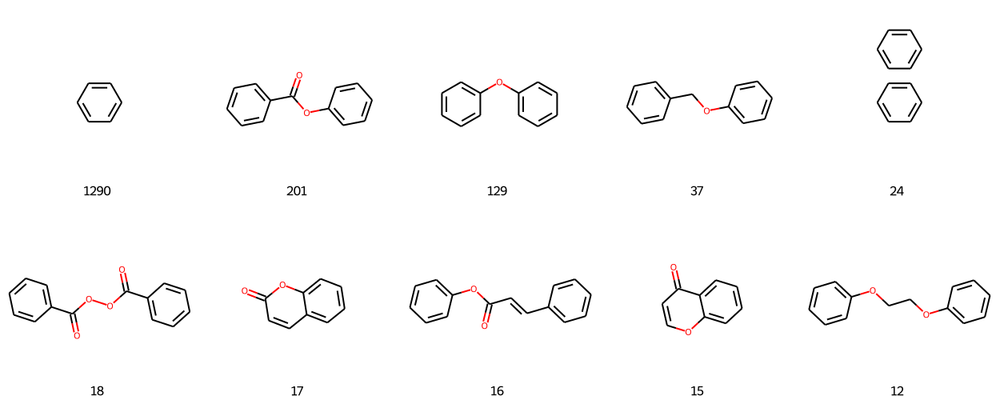

In [27]:
Draw.MolsToGridImage([Chem.MolFromSmiles(s) for s in scaffdf1['SMILES'].tolist()], 
                     subImgSize=(250,250), 
                     molsPerRow=5, 
                     legends=[str(c) for c in scaffdf1['Count'].tolist()], 
                     maxMols=999999)

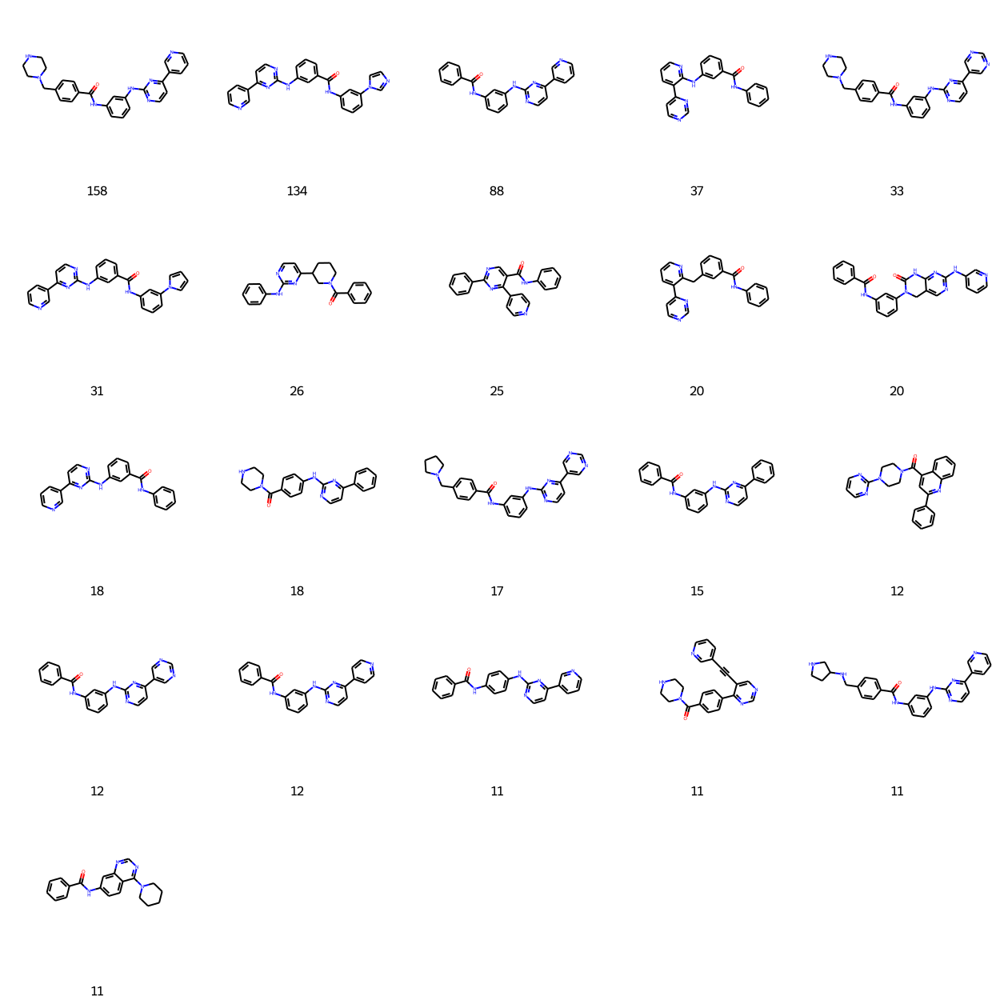

In [28]:
Draw.MolsToGridImage([Chem.MolFromSmiles(s) for s in scaffdf2['SMILES'].tolist()], 
                     subImgSize=(250,250), 
                     molsPerRow=5, 
                     legends=[str(c) for c in scaffdf2['Count'].tolist()], 
                     maxMols=999999)

In [29]:
scaffdf1['Group'] = 'Scaffolds of Group 1'
scaffdf1 = pd.concat([g1, scaffdf1]).reset_index(drop=True)
scaffdf2['Group'] = 'Scaffolds of Group 2'
scaffdf2 = pd.concat([g2, scaffdf2]).reset_index(drop=True)
scaffdf = pd.concat([scaffdf1, scaffdf2]).reset_index(drop=True)
scaffdf

,SMILES,Group,logP,MW,Atom,MR,Count
0,CC(=O)Oc1ccccc1C(=O)O,Group 1,1.3101,180.042259,13.0,44.7103,NaN
1,COC(=O)c1ccccc1O,Group 1,1.1788,152.047344,11.0,39.4463,NaN
2,O=C(Oc1ccccc1C(=O)O)c1ccccc1O,Group 1,2.3096,258.052823,19.0,66.4666,NaN
3,CC(=O)Oc1ccccc1C(=O)[O-].CC(=O)Oc1ccccc1C(=O)[...,Group 1,-0.4300,398.031458,27.0,89.9170,NaN
4,CC(=O)Oc1ccccc1C(=O)OCCO,Group 1,0.7610,224.068473,16.0,55.1193,NaN
...,...,...,...,...,...,...,...
4026,O=C(Nc1cccc(Nc2nccc(-c3ccncc3)n2)c1)c1ccccc1,Scaffolds of Group 2,NaN,NaN,NaN,NaN,12.0
4027,O=C(Nc1ccc(Nc2nccc(-c3cccnc3)n2)cc1)c1ccccc1,Scaffolds of Group 2,NaN,NaN,NaN,NaN,11.0
4028,O=C(c1ccc(-c2ncncc2C#Cc2cccnc2)cc1)N1CCNCC1,Scaffolds of Group 2,NaN,NaN,NaN,NaN,11.0
4029,O=C(Nc1cccc(Nc2nccc(-c3cccnc3)n2)c1)c1ccc(CNC2...,Scaffolds of Group 2,NaN,NaN,NaN,NaN,11.0


In [30]:
scaffpcadfs = []
scafftsnedfs = []
for method in ['Morgan', 'MACCS', 'RDKit']:
    fps = parmap.map(make_fp, [[smi, method] for smi in scaffdf['SMILES'].tolist()], 
                      pm_pbar=True, pm_processes=10)
    
    pca = PCA(n_components=2)
    pcafps = pca.fit_transform(fps)
    
    tsne = TSNE(n_components=2, n_jobs=-1)
    tsnefps = tsne.fit_transform(fps)
    
    pcadf = pd.DataFrame({'X':pcafps[:,0], 'Y':pcafps[:,1], 
                          'Group':scaffdf['Group'].tolist()})
    tsnedf = pd.DataFrame({'X':tsnefps[:,0], 'Y':tsnefps[:,1], 
                          'Group':scaffdf['Group'].tolist()})
    
    scaffpcadfs.append(pcadf)
    scafftsnedfs.append(tsnedf)        

  0%|          | 0/4031 [00:00<?, ?it/s]

  0%|          | 0/4031 [00:00<?, ?it/s]

  0%|          | 0/4031 [00:00<?, ?it/s]

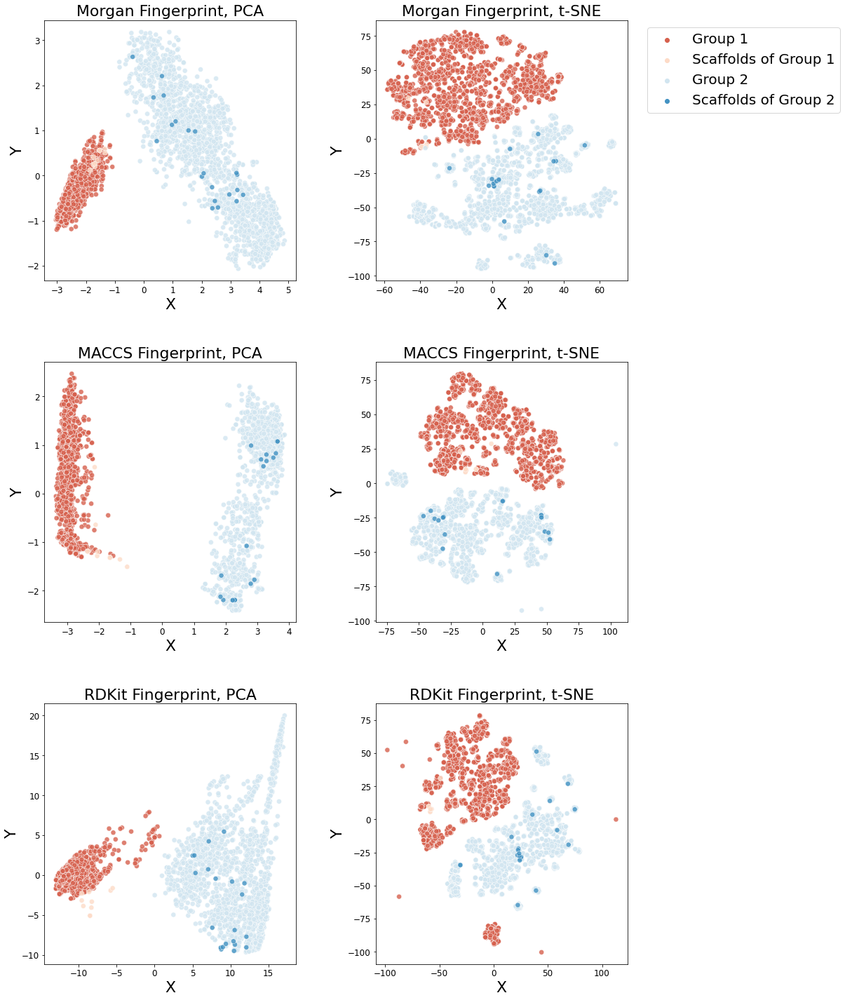

In [31]:
plt.figure(figsize=(18, 21))
p = 1
for method, pcadf, tsnedf in zip(['Morgan', 'MACCS', 'RDKit'], scaffpcadfs, scafftsnedfs):

    plt.subplot(3, 2, p)
    plt.title(f'{method} Fingerprint, PCA', fontsize=22)
    sns.scatterplot(x='X', y='Y', hue='Group', palette='RdBu', data=pcadf, s=ms, alpha=al)
    plt.xlabel('X', fontsize=22)
    plt.ylabel('Y', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend([],[], frameon=False)
    p += 1
    
    plt.subplot(3, 2, p)
    plt.title(f'{method} Fingerprint, t-SNE', fontsize=22)
    sns.scatterplot(x='X', y='Y', hue='Group', palette='RdBu', data=tsnedf, s=ms, alpha=al)
    plt.xlabel('X', fontsize=22)
    plt.ylabel('Y', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    if p == 2:
        plt.legend(bbox_to_anchor=(1.05, 1.0), 
                   loc='upper left', 
                   fontsize=20)
    else:
        plt.legend([],[], frameon=False)
    p += 1
    
plt.tight_layout(pad=5)
plt.show()

In [32]:
scaffpcadfs1 = []
scafftsnedfs1 = []
for method in ['Morgan', 'MACCS', 'RDKit']:
    fps = parmap.map(make_fp, [[smi, method] for smi in scaffdf1['SMILES'].tolist()], 
                      pm_pbar=True, pm_processes=10)
    
    pca = PCA(n_components=2)
    pcafps = pca.fit_transform(fps)
    
    tsne = TSNE(n_components=2, n_jobs=-1)
    tsnefps = tsne.fit_transform(fps)
    
    pcadf = pd.DataFrame({'X':pcafps[:,0], 'Y':pcafps[:,1], 
                          'Group':scaffdf1['Group'].tolist()})
    tsnedf = pd.DataFrame({'X':tsnefps[:,0], 'Y':tsnefps[:,1], 
                          'Group':scaffdf1['Group'].tolist()})
    
    scaffpcadfs1.append(pcadf)
    scafftsnedfs1.append(tsnedf)        

  0%|          | 0/2010 [00:00<?, ?it/s]

  0%|          | 0/2010 [00:00<?, ?it/s]

  0%|          | 0/2010 [00:00<?, ?it/s]

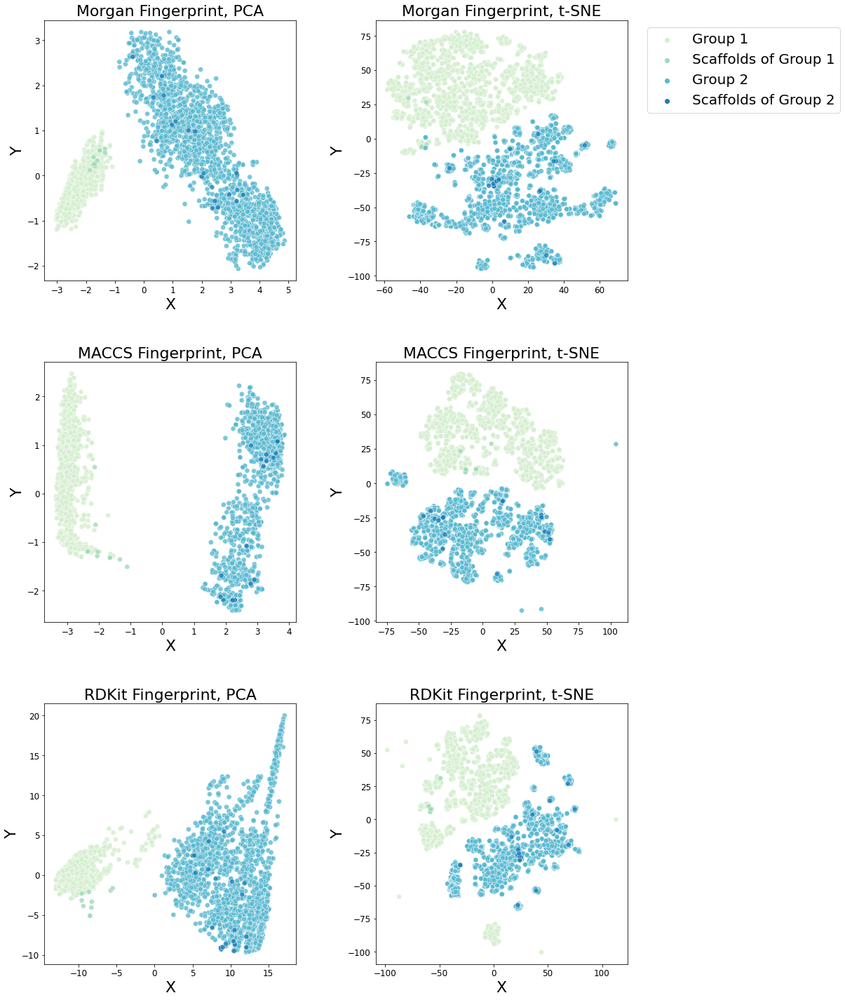

In [33]:
plt.figure(figsize=(18, 21))
p = 1
for method, pcadf, tsnedf in zip(['Morgan', 'MACCS', 'RDKit'], scaffpcadfs, scafftsnedfs):

    plt.subplot(3, 2, p)
    plt.title(f'{method} Fingerprint, PCA', fontsize=22)
    sns.scatterplot(x='X', y='Y', hue='Group', palette='GnBu', data=pcadf, s=ms, alpha=al)
    plt.xlabel('X', fontsize=22)
    plt.ylabel('Y', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend([],[], frameon=False)
    p += 1
    
    plt.subplot(3, 2, p)
    plt.title(f'{method} Fingerprint, t-SNE', fontsize=22)
    sns.scatterplot(x='X', y='Y', hue='Group', palette='GnBu', data=tsnedf, s=ms, alpha=al)
    plt.xlabel('X', fontsize=22)
    plt.ylabel('Y', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    if p == 2:
        plt.legend(bbox_to_anchor=(1.05, 1.0), 
                   loc='upper left', 
                   fontsize=20)
    else:
        plt.legend([],[], frameon=False)
    p += 1
    
plt.tight_layout(pad=5)
plt.show()

In [34]:
scaffpcadfs2 = []
scafftsnedfs2 = []
for method in ['Morgan', 'MACCS', 'RDKit']:
    fps = parmap.map(make_fp, [[smi, method] for smi in scaffdf2['SMILES'].tolist()], 
                      pm_pbar=True, pm_processes=10)
    
    pca = PCA(n_components=2)
    pcafps = pca.fit_transform(fps)
    
    tsne = TSNE(n_components=2, n_jobs=-1)
    tsnefps = tsne.fit_transform(fps)
    
    pcadf = pd.DataFrame({'X':pcafps[:,0], 'Y':pcafps[:,1], 
                          'Group':scaffdf2['Group'].tolist()})
    tsnedf = pd.DataFrame({'X':tsnefps[:,0], 'Y':tsnefps[:,1], 
                          'Group':scaffdf2['Group'].tolist()})
    
    scaffpcadfs2.append(pcadf)
    scafftsnedfs2.append(tsnedf)        

  0%|          | 0/2021 [00:00<?, ?it/s]

  0%|          | 0/2021 [00:00<?, ?it/s]

  0%|          | 0/2021 [00:00<?, ?it/s]

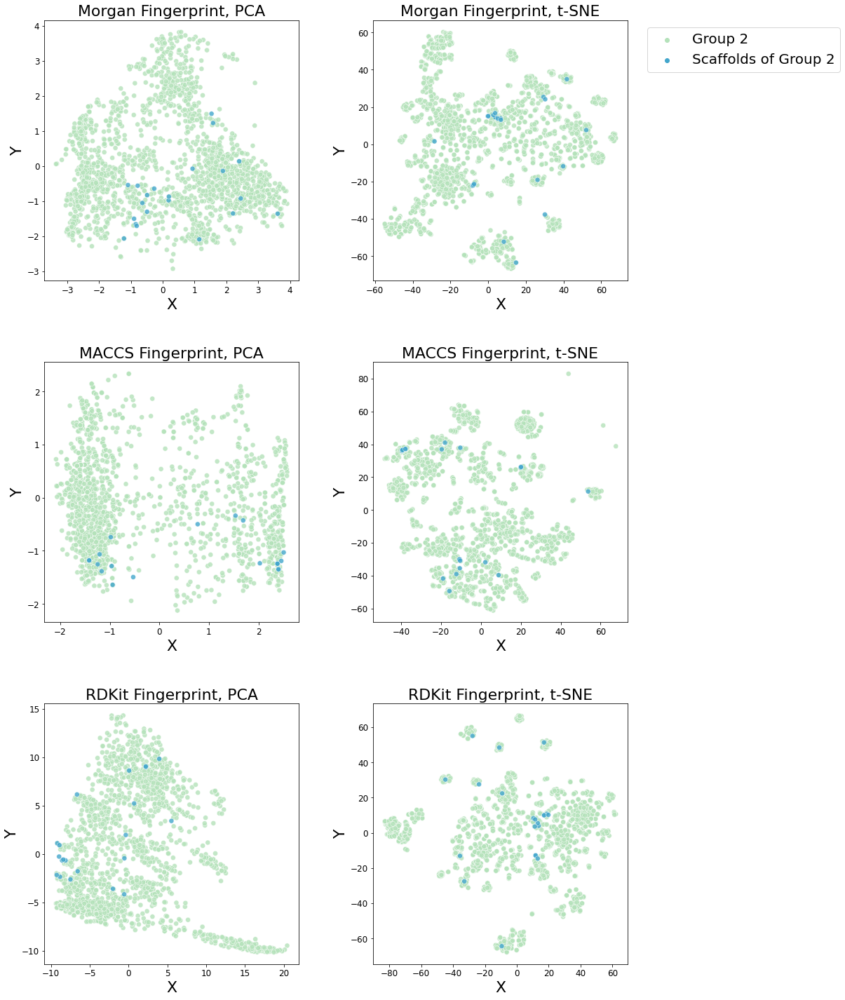

In [35]:
plt.figure(figsize=(18, 21))
p = 1
for method, pcadf, tsnedf in zip(['Morgan', 'MACCS', 'RDKit'], scaffpcadfs2, scafftsnedfs2):

    plt.subplot(3, 2, p)
    plt.title(f'{method} Fingerprint, PCA', fontsize=22)
    sns.scatterplot(x='X', y='Y', hue='Group', palette='GnBu', data=pcadf, s=ms, alpha=al)
    plt.xlabel('X', fontsize=22)
    plt.ylabel('Y', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend([],[], frameon=False)
    p += 1
    
    plt.subplot(3, 2, p)
    plt.title(f'{method} Fingerprint, t-SNE', fontsize=22)
    sns.scatterplot(x='X', y='Y', hue='Group', palette='GnBu', data=tsnedf, s=ms, alpha=al)
    plt.xlabel('X', fontsize=22)
    plt.ylabel('Y', fontsize=22)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    if p == 2:
        plt.legend(bbox_to_anchor=(1.05, 1.0), 
                   loc='upper left', 
                   fontsize=20)
    else:
        plt.legend([],[], frameon=False)
    p += 1
    
plt.tight_layout(pad=5)
plt.show()